In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import random
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from sklearn.model_selection import train_test_split
from keras.models import Model,Sequential
from tensorflow.keras import layers, models
from keras.layers import Conv2D, Flatten,Reshape,Dense,Input,Conv2DTranspose,LeakyReLU,Concatenate,Activation,Dropout, Cropping2D
import tensorflow as tf
from tensorflow.keras.optimizers import RMSprop,Adam
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.layers import BatchNormalization
import glob
import os
import warnings
from tensorflow.keras.layers import GroupNormalization
import keras
warnings.filterwarnings('ignore')

In [2]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("balraj98/edges2shoes-dataset")

print("Path to dataset files:", path)

Mounting files to /kaggle/input/edges2shoes-dataset...
Path to dataset files: /kaggle/input/edges2shoes-dataset


In [3]:
def normalize(img, mask):
    img = tf.cast(img, dtype=tf.float32) / 127.5 - 1.0  # Normalize images to [-1,1]
    mask = tf.cast(mask, dtype=tf.float32)/ 127.5 - 1.0  # Keep masks unchanged
    return img, mask

def denormalize(img):
        return (img + 1) / 2

In [4]:
def process_and_split_batch(images):


    # Get the current width (should be IMG_SIZE[1])
    width = tf.shape(images)[2]
    mid = width // 2  # Calculate the midpoint of the width

    # Split the images along the width dimension.
    # images shape: (batch_size, height, width, channels)
    left_images = images[:, :, :mid, :]
    right_images = images[:, :, mid:, :]

    return left_images, right_images


In [5]:
train_path = "/kaggle/input/pix2pix-dataset/maps/maps/train"
val_path = "/kaggle/input/pix2pix-dataset/maps/maps/val"
BATCH_SIZE = 16
IMG_SIZE = (272, 544)  # (height, width)


# Load training and validation datasets.
train_dataset = image_dataset_from_directory(
    train_path,
    label_mode=None,  # no labels required if images contain both parts
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False  # batching early for efficiency
)

val_dataset = image_dataset_from_directory(
    val_path,
    label_mode=None,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False  # batching early for efficiency
)

# Apply the transformation to split and normalize images.
train_dataset = train_dataset.map(lambda batch: process_and_split_batch(batch),
                        num_parallel_calls=tf.data.AUTOTUNE)
val_dataset = val_dataset.map(lambda batch: process_and_split_batch(batch),
                    num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.map(normalize, num_parallel_calls=tf.data.AUTOTUNE)
val_dataset = val_dataset.map(normalize, num_parallel_calls=tf.data.AUTOTUNE)

# (Optional) Prefetch for further pipeline efficiency.
train_dataset = train_dataset.prefetch(tf.data.AUTOTUNE)
val_dataset = val_dataset.prefetch(tf.data.AUTOTUNE)
train_dataset = train_dataset.prefetch(tf.data.AUTOTUNE).cache()
val_dataset = val_dataset.prefetch(tf.data.AUTOTUNE).cache()


Found 1096 files.
Found 1098 files.


Left images shape: (16, 272, 272, 3)
Right images shape: (16, 272, 272, 3)


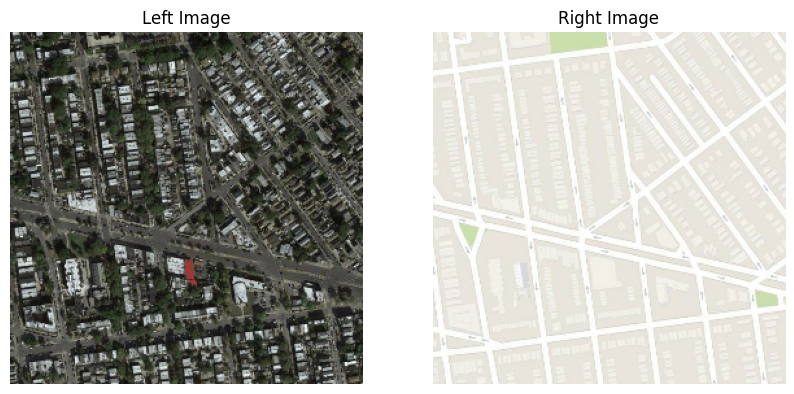

In [6]:

# Assuming train_dataset is already defined and transformed to output (left, right) pairs.
for left, right in train_dataset.take(1):
    print("Left images shape:", left.shape)   # Expected: (BATCH_SIZE, height, width/2, channels)
    print("Right images shape:", right.shape)  # Expected: (BATCH_SIZE, height, width/2, channels)
    
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    
    # Display the left image.
    axes[0].imshow(denormalize(left[0]))
    axes[0].set_title("Left Image")
    axes[0].axis("off")
    
    # Display the right image.
    axes[1].imshow(denormalize(right[0]))
    axes[1].set_title("Right Image")
    axes[1].axis("off")
    
    # Show the plots.
    plt.show()


In [7]:
def encoder_layer(inputs, filters, kernel_size=16, strides=2, activation=None, batch_norm=True):
    conv = Conv2D(filters=filters,
                  kernel_size=kernel_size,
                  strides=strides,
                  padding='same')
    x = conv(inputs)
    if batch_norm:
        x = BatchNormalization()(x)
    if activation == 'relu':
        x = Activation('relu')(x)
    if activation == 'leakyrelu':
        x = LeakyReLU(alpha=0.2)(x)
        

    return x

def decoder_layer(inputs, paired_inputs, filters, kernel_size=16, strides=2, activation='leakyrelu', batch_norm=False, apply_dropout=False, dropout_rate=0.5):
        # Transposed convolution layer.
        conv = Conv2DTranspose(filters=filters,
                               kernel_size=kernel_size,
                               strides=strides,
                               padding='same')
        
        x = conv(inputs)
        
        if batch_norm:
            x = BatchNormalization()(x)
        
        # Apply the specified activation.
        if activation == 'relu':
            x = Activation('relu')(x)
        elif activation == 'leakyrelu':
            x = LeakyReLU(alpha=0.2)(x)
        
        # Apply dropout if requested.
        if apply_dropout:
            x = Dropout(rate=dropout_rate)(x)
        
        # Concatenate with the paired inputs.
        x = Concatenate()([x, paired_inputs])
        
        return x

In [8]:
def build_generator(input_shape,output_shape=None,kernel_size=3,name=None):
     inputs = Input(shape=input_shape)
     channels = int(output_shape[-1])
     e1 = encoder_layer(inputs,32,kernel_size=kernel_size,activation='leakyrelu',strides=1,batch_norm=False)
     e2 = encoder_layer(e1,64,kernel_size=kernel_size,activation='leakyrelu',strides=2,batch_norm=True)
     e3 = encoder_layer(e2,128,kernel_size=kernel_size,activation='leakyrelu',strides=2,batch_norm=True)
     e4 = encoder_layer(e3,256,kernel_size=kernel_size,activation='leakyrelu',strides=2,batch_norm=True)
     e5 = encoder_layer(e4,512,kernel_size=kernel_size,activation='leakyrelu',strides=2,batch_norm=True)
    

     d1 = decoder_layer(e5,e4,256,kernel_size=kernel_size,apply_dropout=True)
     d2 = decoder_layer(d1,e3,128,kernel_size=kernel_size,apply_dropout=True)
     d3 = decoder_layer(d2,e2,64,kernel_size=kernel_size)
     d4 = decoder_layer(d3,e1,32,kernel_size=kernel_size)
     outputs = Conv2DTranspose(channels,kernel_size=kernel_size,strides=1,activation='tanh',
     padding='same')(d4)
     generator = Model(inputs, outputs, name=name)
     return generator

def build_discriminator(input_shape, kernel_size=3, name=None):
    inputs = Input(shape=input_shape)
    x = encoder_layer(inputs, 32, kernel_size=kernel_size, activation='leakyrelu', batch_norm=False)
    x = encoder_layer(x, 64, kernel_size=kernel_size, activation='leakyrelu', batch_norm=True)
    x = encoder_layer(x, 128, kernel_size=kernel_size, activation='leakyrelu', batch_norm=True)
    x = encoder_layer(x, 256, kernel_size=kernel_size, strides=1, activation='leakyrelu', batch_norm=True)
    x = Conv2D(3, kernel_size=kernel_size, strides=1, padding='same')(x)
    discriminator = Model(inputs, x, name=name)
    return discriminator

In [9]:
class Pix2Pix_gan(tf.keras.Model):
  def __init__(self, generator, discriminator):
        super().__init__()
        self.generator = generator
        self.discriminator = discriminator
  def compile(self,g_optimizer,d_optimizer,loss_fn):
        super().compile()  # This works in Python 3+
        self.g_optimizer = g_optimizer
        self.d_optimizer = d_optimizer
        self.loss_fn = loss_fn


  @tf.function
  def train_step(self,batch_data):
      real_x, real_y = batch_data
      with tf.GradientTape(persistent=True) as tape_d:
          fake_y = self.generator(real_x, training=True)

          disc_fake_y = self.discriminator(fake_y, training=True)
          disc_real_y = self.discriminator(real_y, training=True)

          # Compute discriminator losses
          disc_loss = 0.5 *( loss_fn(tf.ones_like(disc_real_y), disc_real_y) + \
                        loss_fn(tf.zeros_like(disc_fake_y), disc_fake_y))


      # Apply gradients for both discriminators
      grads_d = tape_d.gradient(disc_loss, self.discriminator.trainable_variables)
      self.d_optimizer.apply_gradients(zip(grads_d,self.discriminator.trainable_variables))

      with tf.GradientTape(persistent=True) as tape_g:
          fake_y = self.generator(real_x, training=True)
          
          disc_fake_y = self.discriminator(fake_y, training=False)#previous True

          # Compute generator losses
          g_loss = loss_fn(tf.ones_like(disc_fake_y), disc_fake_y)
          l1_loss = tf.reduce_mean(tf.abs(real_y - fake_y))
          total_loss =  g_loss + 100 * l1_loss

      grads_g = tape_g.gradient(total_loss, self.generator.trainable_variables)
      self.g_optimizer.apply_gradients(zip(grads_g, self.generator.trainable_variables))
      del tape_g  # ✅ Free memory

      return {
        "D Loss": disc_loss,
        "G Loss": total_loss,
      }



In [10]:
class VisualizationCallback(tf.keras.callbacks.Callback):
    def __init__(self, generator, val_dataset, denormalize, num_samples=2):
        """
        Callback to visualize predictions during training.
        
        Args:
        - generator: The trained generator model.
        - val_dataset: Validation dataset (paired: (blurred, sharp)).
        - denormalize: Function to denormalize images.
        - num_samples: Number of images to visualize.
        """
        self.generator = generator
        self.val_dataset = val_dataset
        self.denormalize = denormalize
        self.num_samples = num_samples

    def on_epoch_end(self, epoch, logs=None):
        # Get a batch from validation dataset
        for blurred, sharp in self.val_dataset.take(1):  # Take 1 batch
            blurred = blurred[:self.num_samples]  # Select `num_samples` images
            sharp = sharp[:self.num_samples]

            # Generate predictions
            predicted = self.generator(blurred, training=False)


            # Plot images
            fig, axes = plt.subplots(self.num_samples, 3, figsize=(5, 2 * self.num_samples))

            for i in range(self.num_samples):
                axes[i, 0].imshow(denormalize(blurred[i]))   # Blurred input
                axes[i, 0].set_title("Blurred (Input)")
                axes[i, 0].axis("off")

                axes[i, 1].imshow(denormalize(sharp[i]))     # Ground Truth
                axes[i, 1].set_title("Sharp (Ground Truth)")
                axes[i, 1].axis("off")

                axes[i, 2].imshow(denormalize(predicted[i])) # Model Prediction
                axes[i, 2].set_title("Predicted (Deblurred)")
                axes[i, 2].axis("off")

            plt.suptitle(f"Epoch {epoch + 1} - Deblurring Results", fontsize=14)
            plt.tight_layout()
            plt.show()
            break  # Only take one batch per epoch


In [11]:
g = build_generator((272,272,3),(272,272,3))
d = build_discriminator((272,272,3),3)
Pix2Pix_gan = Pix2Pix_gan(g,d)

In [12]:
optimizer_d = Adam(learning_rate=1e-4, beta_1=0.5, beta_2=0.999)  # Reduce D learning rate
optimizer_g = Adam(learning_rate=2e-4, beta_1=0.5, beta_2=0.999)  # Keep G the same
loss_fn = tf.keras.losses.BinaryCrossentropy(from_logits=True)
Pix2Pix_gan.compile(optimizer_g,optimizer_d,loss_fn)

In [13]:
vis_callback = VisualizationCallback(g, val_dataset, denormalize)

In [ ]:
Pix2Pix_gan.fit(train_dataset, epochs=80, callbacks=[vis_callback])

In [17]:
g.save("Pix2Pix streets satelliete gen.h5")
d.save("Pix2Pix streets satelliete disc.h5")

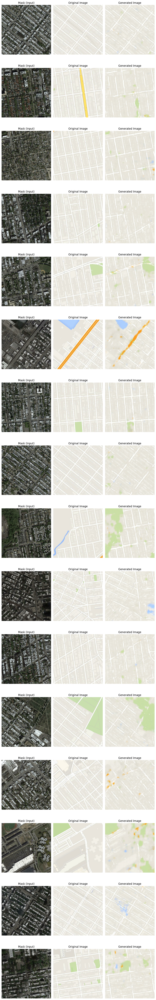

In [23]:
def visualize(generator, val_dataset, num_samples=16):
    
    # Take a small sample from the validation dataset
    dataset_batches = list(val_dataset.take(4))  # Get 2 batches
    batch_idx = random.randint(0, 1)  # Pick a random batch

    # Extract masks and images
    masks, imgs = dataset_batches[batch_idx]

    # Select random indices
    num_available = masks.shape[0]
    selected_indices = random.sample(range(num_available), min(num_samples, num_available))

    # Pick the selected samples
    selected_masks = tf.gather(masks, selected_indices)
    selected_imgs = tf.gather(imgs, selected_indices)

    # Generate predictions
    generated_imgs = generator(selected_masks, training=False)

    # Plot results
    fig, axes = plt.subplots(len(selected_indices), 3, figsize=(10, 4 * len(selected_indices)))

    for i, idx in enumerate(selected_indices):
        axes[i, 0].imshow(denormalize(selected_masks[i]))  # Input mask
        axes[i, 0].set_title("Mask (Input)")
        axes[i, 0].axis("off")

        axes[i, 1].imshow(denormalize(selected_imgs[i]))  # Ground truth
        axes[i, 1].set_title("Original Image")
        axes[i, 1].axis("off")

        axes[i, 2].imshow(denormalize(generated_imgs[i]))  # Model output
        axes[i, 2].set_title("Generated Image")
        axes[i, 2].axis("off")

    plt.tight_layout()
    plt.show()

# Example usage
visualize(g, val_dataset)
